In [16]:
import cv2
import numpy as np
import matplotlib.pyplot as plt
import os

### Preprocessing

I am going to split the 1920 X 1080 image into 10 blocks

In [17]:
def load_and_split_image(image_path, block_size=(192, 108)):
    # Load the image using OpenCV
    image = cv2.imread(image_path)
    
    # Convert BGR to RGB (OpenCV uses BGR by default)
    image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)
    
    img_height, img_width, _ = image.shape
    blocks_horizontal = img_width // block_size[0]
    blocks_vertical = img_height // block_size[1]
    
    blocks = []
    
    for i in range(blocks_vertical):
        for j in range(blocks_horizontal):
            # Define the coordinates of the rectangle [x1, y1, x2, y2]
            x1 = j * block_size[0]
            y1 = i * block_size[1]
            x2 = x1 + block_size[0]
            y2 = y1 + block_size[1]
            
            # Crop the block and add to the list
            block = image[y1:y2, x1:x2]
            blocks.append(block)
    
    return blocks

In [18]:
def display_blocks(blocks, blocks_per_row=10):
    # Calculate the number of rows needed in the subplot
    num_blocks = len(blocks)
    num_rows = np.ceil(num_blocks / blocks_per_row).astype(int)
    
    fig, axes = plt.subplots(num_rows, blocks_per_row, figsize=(20, 20))
    
    # Flatten the axes array for easy indexing
    axes = axes.flatten()
    
    for i, block in enumerate(blocks):
        axes[i].imshow(block)
        axes[i].axis('off')
    
    # Hide any unused subplots
    for j in range(i + 1, len(axes)):
        axes[j].axis('off')
    
    plt.tight_layout()
    plt.show()

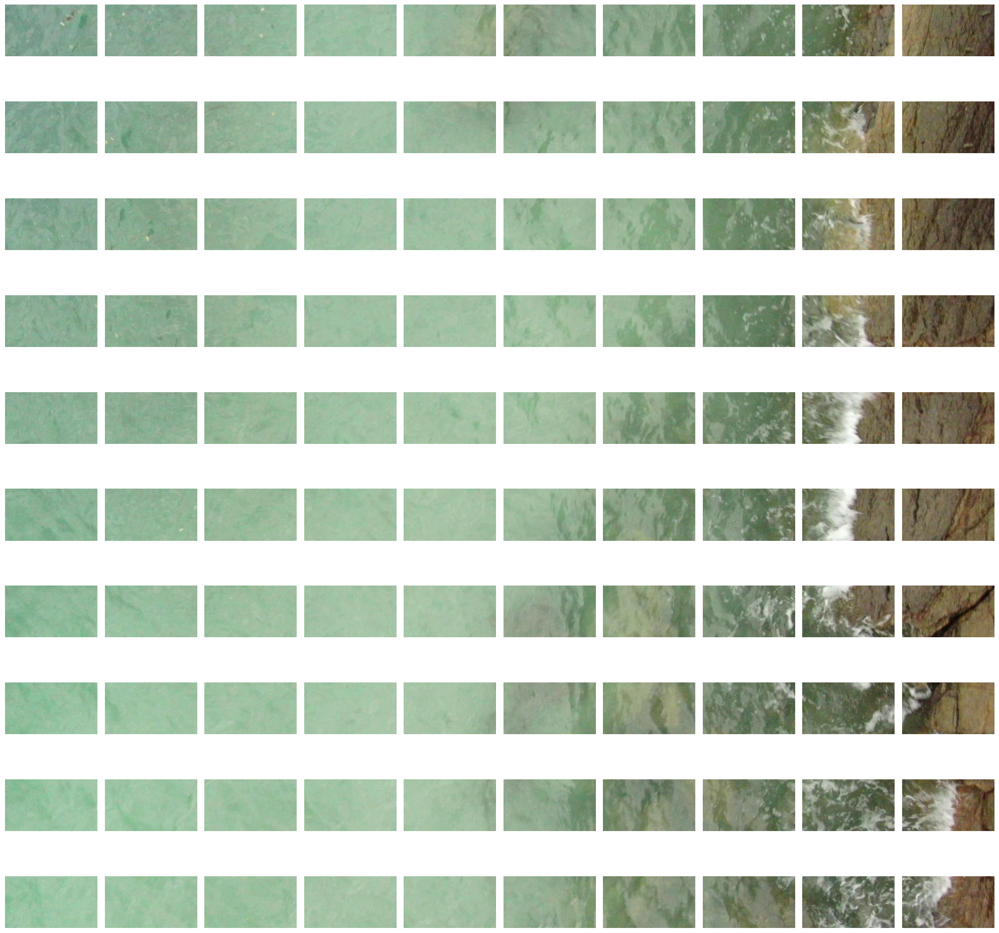

In [19]:
# Path to the image
image_path = "./images/1175.jpg"
full_image = cv2.imread(image_path)
kernel_defs = []

# Load and split the image
blocks = load_and_split_image(image_path)

# Display the blocks
display_blocks(blocks)

### Creating Gabor Kernels

Next, I want to find Gabor kernels that when convolved with an image accept only features of the shark.

In [20]:
def generate_gabor_kernels(size, num_kernels):
    kernels = []
    thetas = np.linspace(0, np.pi, num_kernels // 4, endpoint=False)
    sigmas = [1.0, 2.0, 3.0, 4.0]
    lambdas = [10.0, 15.0, 20.0]
    gammas = [0.5, 1.0, 1.5]
    psis = [0, np.pi / 2]

    for theta in thetas:
        for sigma in sigmas:
            for lambd in lambdas:
                for gamma in gammas:
                    for psi in psis:
                        kern = cv2.getGaborKernel((size, size), sigma, theta, lambd, gamma, psi, ktype=cv2.CV_64F)
                        kernels.append(kern)
                        kernel_defs.append([f"Size: { (size, size)}", f"Sigma: {sigma}", f"Theta: {theta}", f"Lambda: {lambd}", f"Gamma: {gamma}", f"Psi: {psi}"])
    return kernels

In [21]:
def display_kernels(kernels, cols=5):
    num_kernels = len(kernels)
    rows = num_kernels // cols + (0 if num_kernels % cols == 0 else 1)
    fig, axes = plt.subplots(nrows=rows, ncols=cols, figsize=(cols*2, rows*2))
    for i, ax in enumerate(axes.flat):
        if i < num_kernels:
            ax.title.set_text(i)
            ax.imshow(kernels[i], cmap='gray')
            ax.axis('off')
        else:
            ax.axis('off')
    
    plt.tight_layout()
    plt.show()

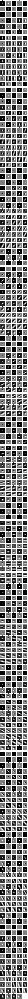

In [22]:
size = 20
num_kernels = 50 
kernels = generate_gabor_kernels(size, num_kernels)

display_kernels(kernels)

In [23]:
def convolve_image_with_kernels(image, kernels):
    convolved_images = []
    for kernel in kernels:
        # ddepth = -1 means the output image will have the same depth as the source
        img_convolved = cv2.filter2D(image, -1, kernel)
        convolved_images.append(img_convolved)
    return convolved_images

In [24]:
def display_images(images, cols=5, cmap='gray'):
    num_images = len(images)
    rows = num_images // cols + (0 if num_images % cols == 0 else 1)
    fig, axes = plt.subplots(nrows=rows, ncols=cols, figsize=(cols*2, rows*2))
    for i, ax in enumerate(axes.flat):
        if i < num_images:
            ax.title.set_text(i)
            ax.imshow(images[i], cmap=cmap)
            ax.axis('off')
        else:
            ax.axis('off')
        
    plt.tight_layout()
    plt.show()

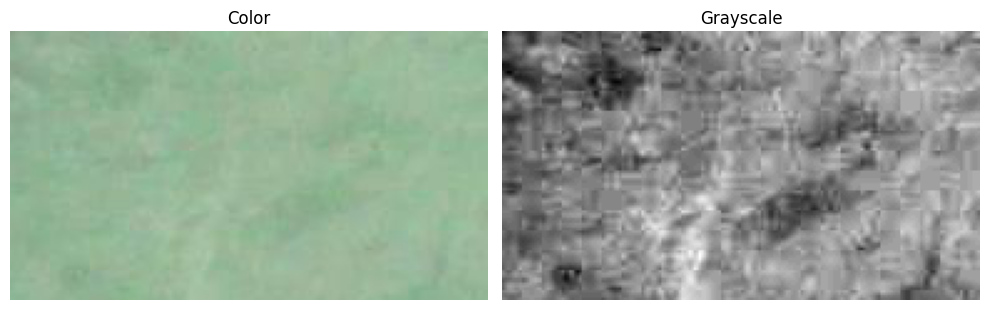

In [25]:
grey = cv2.cvtColor(blocks[42], cv2.COLOR_RGB2GRAY)

plt.figure(figsize=(10, 5))

plt.subplot(1, 2, 1)
plt.imshow(blocks[42])
plt.title("Color")
plt.axis('off')

plt.subplot(1, 2, 2)
plt.imshow(grey, cmap='gray')
plt.title('Grayscale')
plt.axis('off')

plt.tight_layout()
plt.show()

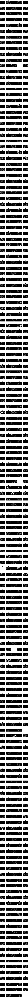

In [26]:
image = cv2.cvtColor(blocks[42], cv2.COLOR_RGB2GRAY)

# Convolve the image with each kernel
convolved_images = convolve_image_with_kernels(image, kernels)

# Display the results
display_images(convolved_images)

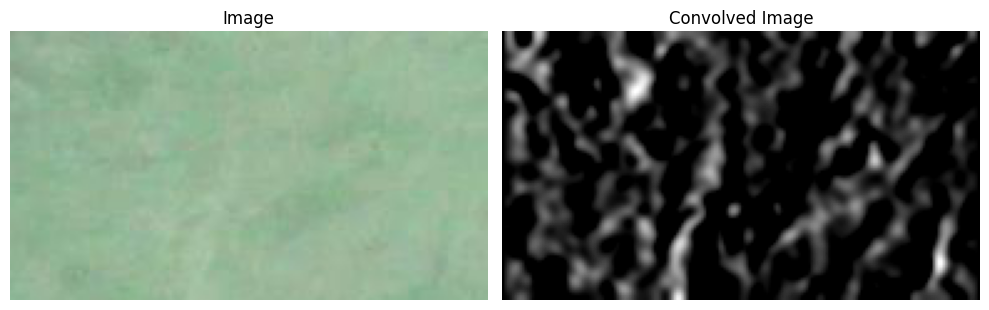

In [27]:
plt.figure(figsize=(10, 5))

plt.subplot(1, 2, 1)
plt.imshow(blocks[42])
plt.title("Image")
plt.axis('off')

plt.subplot(1, 2, 2)
plt.imshow(convolved_images[53], cmap='gray')
plt.title('Convolved Image')
plt.axis('off')

plt.tight_layout()
plt.show()

We can see that the 54th kernel and others in that range highlight the features of the shark quite well in grayscale

In [28]:
effective_filters_idxs = np.array([1, 11, 125], dtype=np.int32)
effective_kernels = np.array(kernels)[effective_filters_idxs]

kernel_defs_np = np.array(kernel_defs)

for strings in kernel_defs_np[effective_filters_idxs]:
    for string in strings:
        print(string)

    print("===============") 

Size: (20, 20)
Sigma: 1.0
Theta: 0.0
Lambda: 10.0
Gamma: 0.5
Psi: 1.5707963267948966
Size: (20, 20)
Sigma: 1.0
Theta: 0.0
Lambda: 15.0
Gamma: 1.5
Psi: 1.5707963267948966
Size: (20, 20)
Sigma: 3.0
Theta: 0.2617993877991494
Lambda: 20.0
Gamma: 1.5
Psi: 1.5707963267948966


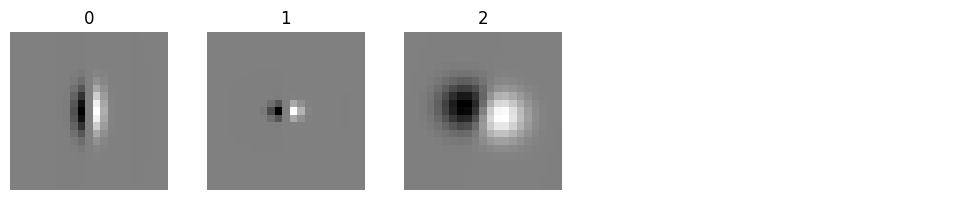

In [29]:
display_kernels(effective_kernels)

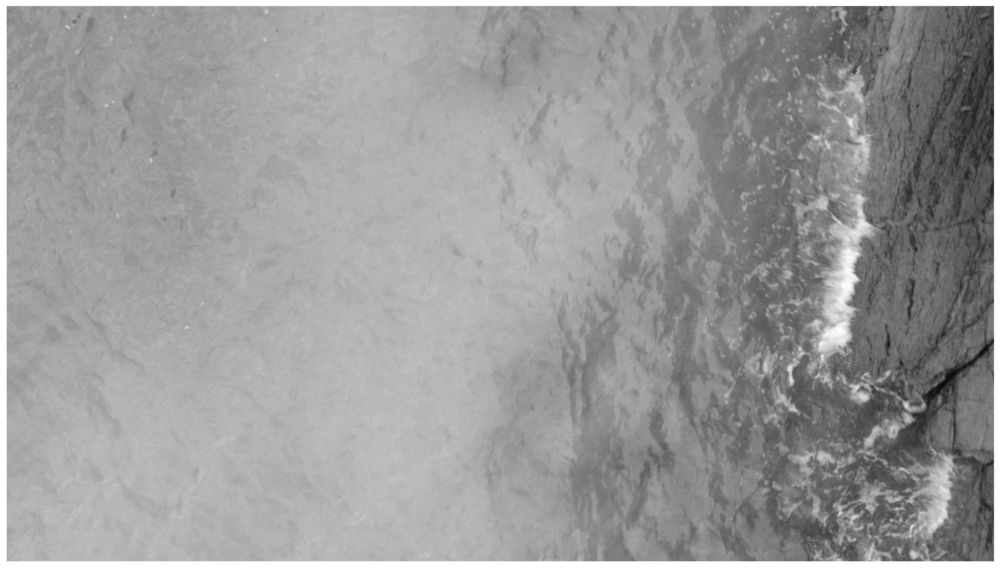

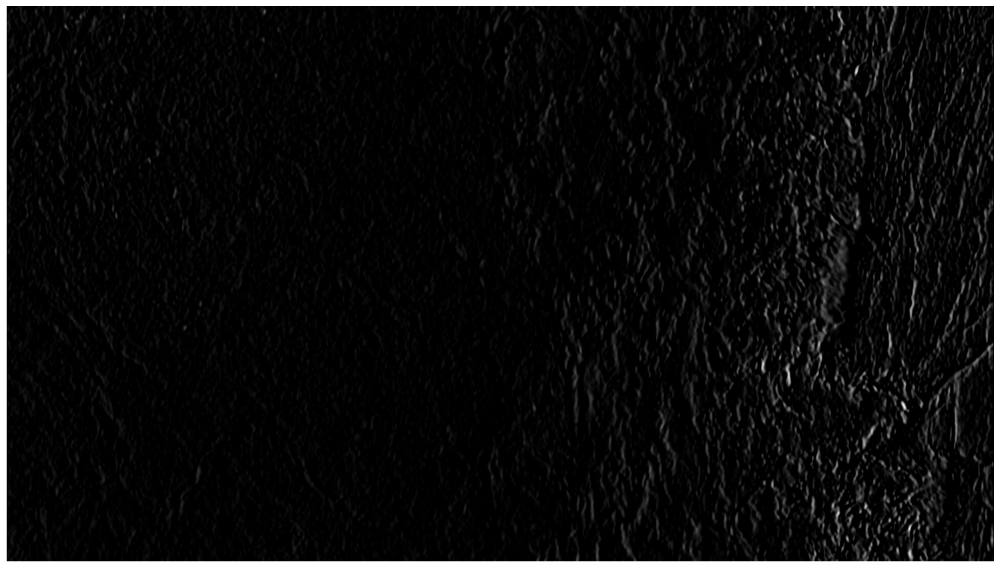

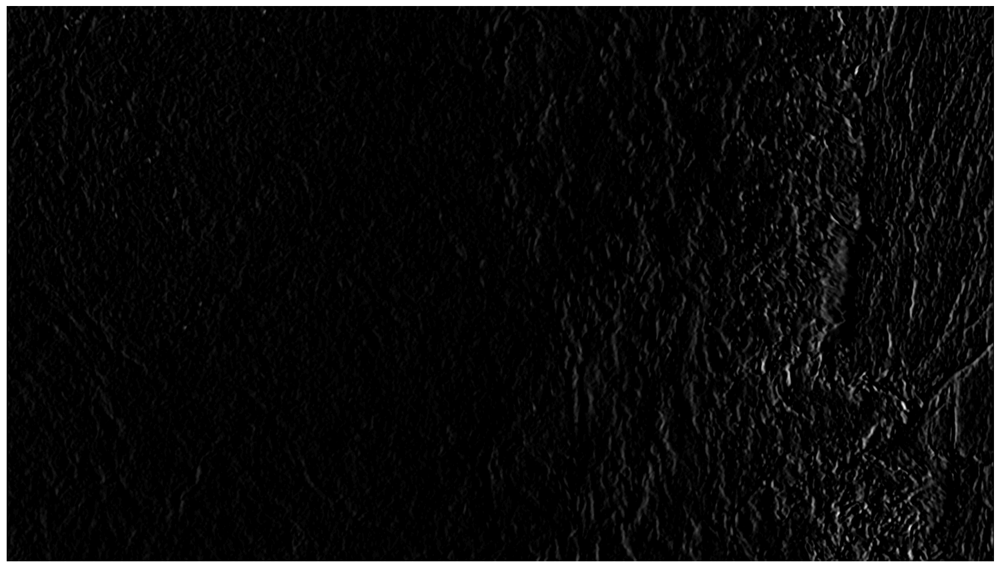

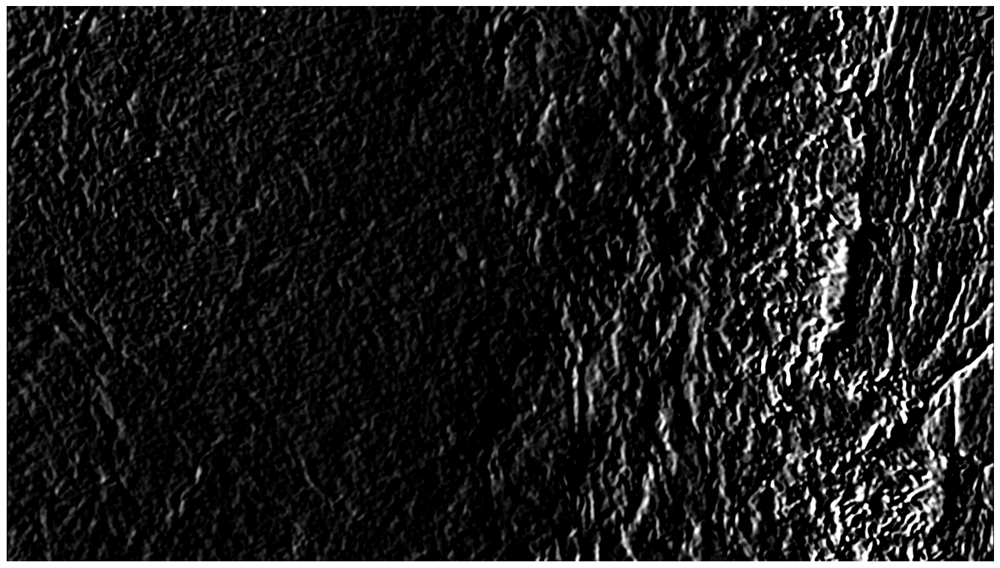

In [30]:
# Assuming 'full_image' is defined and loaded here
# Convert the image to grayscale before using it for convolution
full_image = cv2.cvtColor(full_image, cv2.COLOR_BGR2GRAY)

# Display the grayscale image
fig, ax = plt.subplots(figsize=(19.2, 10.8))  # Size for a 1920x1080 display
ax.imshow(cv2.cvtColor(full_image, cv2.COLOR_GRAY2RGB))
ax.axis('off')  # Optional: Remove axis
plt.show()

# Assuming 'convolve_image_with_kernels' and 'effective_kernels' are defined here
convolve_results = convolve_image_with_kernels(cv2.GaussianBlur(full_image, (5, 5), 5, 5), effective_kernels)

for image in convolve_results:
    # Get the size of the image
    height, width = image.shape  # Corrected the order to (height, width)
    
    # Calculate the figure size in inches for a 1920x1080 resolution
    dpi = 100.0
    figsize = (width / dpi, height / dpi)
    
    # Create a figure and an axis
    fig, ax = plt.subplots(figsize=figsize)
    
    # Display the image
    ax.imshow(image, cmap="gray")
    
    # Remove axis
    ax.axis('off')
    
    # Show the plot in full size
    plt.show()
